Define imports

In [1]:
# Standard library imports
import logging
import warnings
from itertools import combinations

# Core data science packages
import numpy as np
import pandas as pd

# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(name)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Suppress warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Scikit-learn
from sklearn.preprocessing import PolynomialFeatures, LabelEncoder, robust_scale
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import Ridge, RidgeClassifier, LogisticRegression
from sklearn.ensemble import RandomForestClassifier, IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope
from sklearn.cluster import DBSCAN
from sklearn.metrics import (
    roc_auc_score, roc_curve, precision_recall_curve,
    confusion_matrix, precision_score, recall_score
)

# Time series analysis
from statsmodels.tsa.stattools import acf, pacf, ccf, grangercausalitytests

# Specialized ML libraries
from lightgbm import LGBMClassifier
from catboost import CatBoost, CatBoostClassifier, Pool

# Constants
RANDOM_SEED = 42

## Load Data

In [2]:
warnings.simplefilter('ignore')
train = pd.read_csv('/kaggle/input/playground-series-s5e3/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s5e3/test.csv')
train_features = list(train)

# fill nan values with mean 
train = train.fillna(train.mean())
test = test.fillna(test.mean())

train.head(5)

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1
2,2,3,1024.1,19.4,16.1,14.6,9.3,75.0,47.0,8.3,70.0,18.1,1
3,3,4,1013.4,18.1,17.8,16.9,16.8,95.0,95.0,0.0,60.0,35.6,1
4,4,5,1021.8,21.3,18.4,15.2,9.6,52.0,45.0,3.6,40.0,24.8,0


In [3]:
original_features = ['pressure','temparature', 'cloud', 'sunshine', 'humidity', 'windspeed']#, 'maxtemp',  'mintemp',   'winddirection', 'windspeed']

In [4]:
print("Target Distribution:\n", train['rainfall'].value_counts(normalize=True))
print("Dataframe Shape:", train.shape)
print("Feature Types:\n", train.dtypes)

Target Distribution:
 rainfall
1    0.753425
0    0.246575
Name: proportion, dtype: float64
Dataframe Shape: (2190, 13)
Feature Types:
 id                 int64
day                int64
pressure         float64
maxtemp          float64
temparature      float64
mintemp          float64
dewpoint         float64
humidity         float64
cloud            float64
sunshine         float64
winddirection    float64
windspeed        float64
rainfall           int64
dtype: object


# Distribution Analysis

Distribution patters are important to understand the data and the features.
In our case, patterns are different relative to the target variable - this is a good sign.

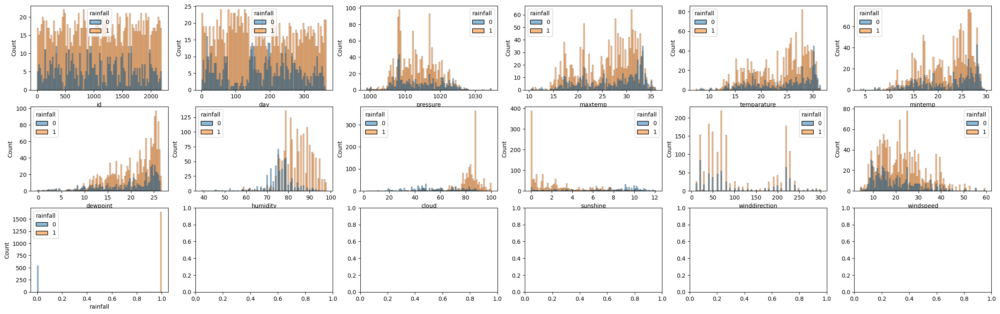

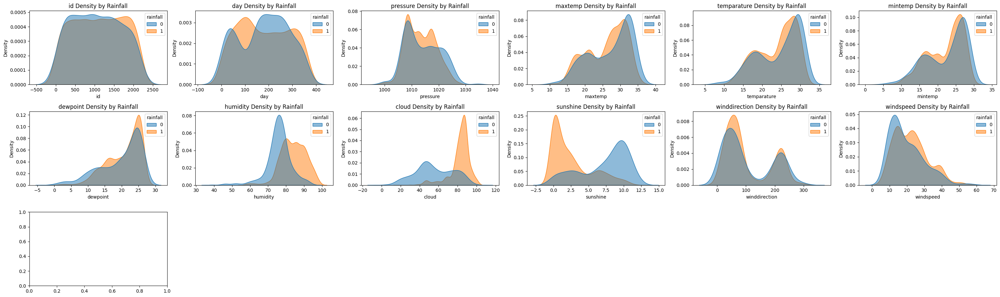

In [5]:
# make an adjustable grid of subplots
columns = 6
rows = len(train.columns) // columns + 1
fig, axs = plt.subplots(rows, columns, figsize=(columns * 5, rows * 3))

# iterate over all columns and create a plot
for i, col in enumerate(train.columns):
    sns.histplot(data=train, x=col, hue="rainfall", kde=False, bins=100, ax=axs[i // columns, i % columns])

fig, axs = plt.subplots(rows, columns, figsize=(columns * 5, rows * 3))
for i, col in enumerate(train.columns):
    if col != "rainfall":
        sns.kdeplot(
            data=train,
            x=col,
            hue="rainfall",
            fill=True,
            common_norm=False,  # Each distribution will sum to 1
            alpha=0.5,
            ax=axs[i // columns, i % columns]
        )
        axs[i // columns, i % columns].set_title(f"{col} Density by Rainfall")

# Remove empty subplots if any
for i in range(len(train.columns), rows * columns):
    fig.delaxes(axs[i // columns, i % columns])

plt.tight_layout()
plt.show()

# Correlation and Causation Analysis

Some of our features are more correlated with the target than others.
Also, some features have strong correlation with each other - this is important to consider when building models.

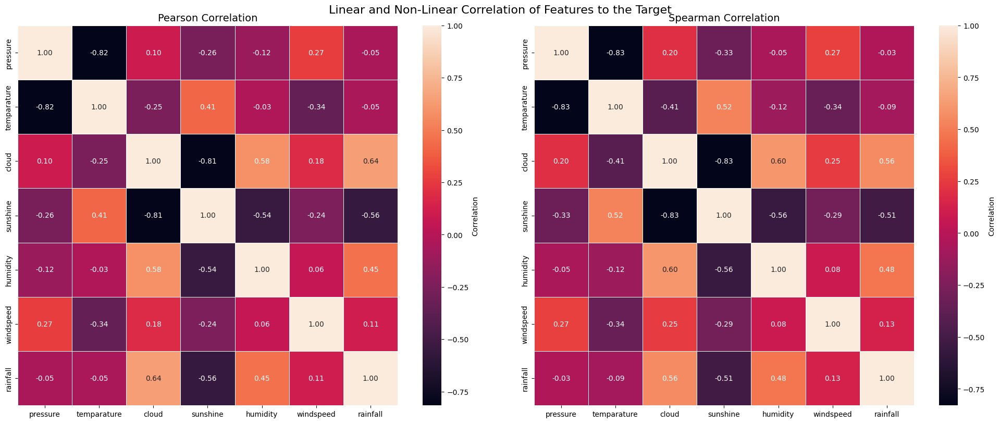

In [6]:
# Calculate Pearson and Spearman correlations
pearson_corr = train[original_features + ['rainfall']].corr(method='pearson')
spearman_corr = train[original_features + ['rainfall']].corr(method='spearman')

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Create Pearson correlation heatmap
sns.heatmap(
    pearson_corr,
    annot=True,
    # cmap='OrRd',
    fmt='.2f',
    square=True,
    linewidths=0.5,
    ax=axes[0],
    cbar_kws={'label': 'Correlation'}
)
axes[0].set_title('Pearson Correlation', fontsize=14)

# Create Spearman correlation heatmap
sns.heatmap(
    spearman_corr,
    annot=True,
    # cmap='OrRd',
    fmt='.2f',
    square=True,
    linewidths=0.5,
    ax=axes[1],
    cbar_kws={'label': 'Correlation'}
)
axes[1].set_title('Spearman Correlation', fontsize=14)

# Update layout
plt.suptitle('Linear and Non-Linear Correlation of Features to the Target', fontsize=16)
plt.tight_layout()

# Show plot
plt.show()

Some features demonstrate strong cross correlation with the target variable.
We will pay special attention to these features when building models.

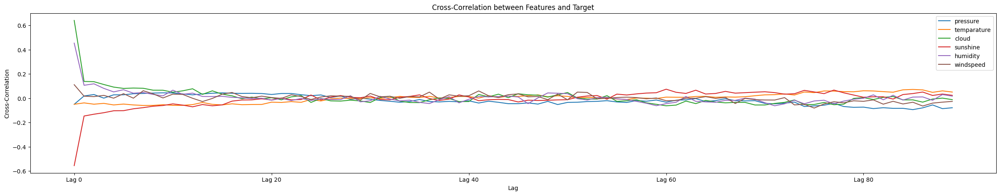

In [7]:
def compute_cross_correlation(x, y, max_lag=50):
    return ccf(x, y, adjusted=False)[:max_lag]

def analyze_cross_correlations(data, features, target, max_lag=50):
    results = {}
    for feature in features:
        ccf_values = compute_cross_correlation(data[feature], data[target], max_lag)
        results[feature] = ccf_values

    df_results = pd.DataFrame(results, index=[f'Lag {i}' for i in range(max_lag)])

    # Adjust the plot size here
    fig, ax = plt.subplots(figsize=(30, 5))
    df_results.plot(ax=ax)
    ax.set_title('Cross-Correlation between Features and Target')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Cross-Correlation')
    ax.legend(loc='upper right')
    plt.show()

# Apply to the dataset
cross_corr_results = analyze_cross_correlations(train, original_features, 'rainfall', max_lag=90)

To understand if we are truly working with a time series, we will analyze the autocorrelation and partial autocorrelation of the features.
- Autocorrelation is the correlation of a signal with a delayed copy of itself as a function of delay.
- Partial autocorrelation is the correlation of a signal with a delayed copy of itself, with the linear dependence of all shorter delays removed.
If there is a strong autocorrelation, we can create rolling features to capture the time series nature of the data.

* Be careful with lags, pick ones that might be relevant to the problem.

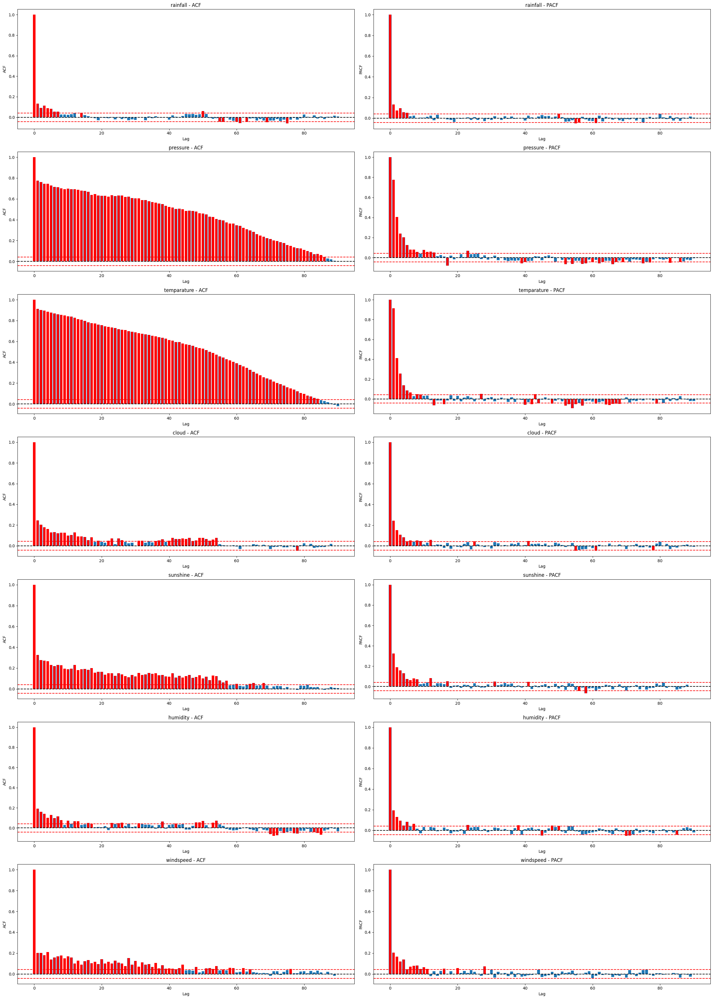

In [8]:
# List of features to plot
all_features = ['rainfall'] + original_features

def plot_acf_pacf(data, features, lags=90, alpha=0.05):
    """
    Create static ACF and PACF plots for multiple features with significant lags highlighted.

    Parameters:
    data (pd.DataFrame): The input dataframe containing the features
    features (list): List of feature names to plot
    lags (int): Number of lags to include in the plots
    alpha (float): Significance level for identifying meaningful correlations
    """
    n_features = len(features)
    fig, axes = plt.subplots(n_features, 2, figsize=(25, 5*n_features))

    for i, feature in enumerate(features):
        series = data[feature]

        # Calculate ACF and PACF
        acf_values = acf(series, nlags=lags)
        pacf_values = pacf(series, nlags=lags)

        # Calculate confidence intervals
        conf_int = 1.96 / np.sqrt(len(series))

        # Identify significant lags
        significant_lags_acf = np.where(np.abs(acf_values) > conf_int)[0]
        significant_lags_pacf = np.where(np.abs(pacf_values) > conf_int)[0]

        # Plot ACF
        axes[i, 0].bar(range(lags + 1), acf_values)
        axes[i, 0].axhline(y=0, color='black', linestyle='--')
        axes[i, 0].axhline(y=conf_int, color='red', linestyle='--')
        axes[i, 0].axhline(y=-conf_int, color='red', linestyle='--')
        axes[i, 0].set_title(f'{feature} - ACF')
        axes[i, 0].set_xlabel('Lag')
        axes[i, 0].set_ylabel('ACF')

        # Highlight significant lags for ACF
        axes[i, 0].bar(significant_lags_acf, acf_values[significant_lags_acf], color='red', width=0.7)

        # Plot PACF
        axes[i, 1].bar(range(lags + 1), pacf_values)
        axes[i, 1].axhline(y=0, color='black', linestyle='--')
        axes[i, 1].axhline(y=conf_int, color='red', linestyle='--')
        axes[i, 1].axhline(y=-conf_int, color='red', linestyle='--')
        axes[i, 1].set_title(f'{feature} - PACF')
        axes[i, 1].set_xlabel('Lag')
        axes[i, 1].set_ylabel('PACF')

        # Highlight significant lags for PACF
        axes[i, 1].bar(significant_lags_pacf, pacf_values[significant_lags_pacf], color='red', width=0.7)

    plt.tight_layout()
    plt.show()

# Apply to the dataset
plot_acf_pacf(train, all_features)

Granger causality tests are used to determine if one time series can predict another.
We will use this to analyze the features and the target variable.

- Points below the red line indicate statistically significant Granger causality
- Features with lines consistently below the red line are strong predictors
- The slope of the lines can indicate how the predictive power changes with increasing lag


Granger Causality Test: pressure -> rainfall

Granger Causality Test: temparature -> rainfall

Granger Causality Test: cloud -> rainfall

Granger Causality Test: sunshine -> rainfall

Granger Causality Test: humidity -> rainfall

Granger Causality Test: windspeed -> rainfall


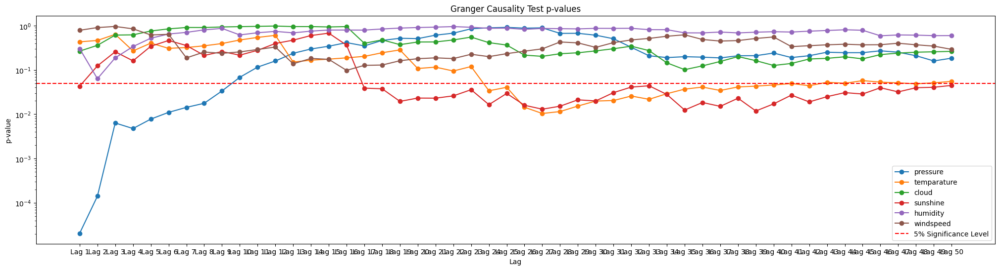

In [9]:
def granger_causality(data, features, target, max_lag=5):
    results = {}
    for feature in features:
        print(f"\nGranger Causality Test: {feature} -> {target}")
        granger_test = grangercausalitytests(data[[feature, target]].dropna(), maxlag=max_lag, verbose=False)

        # Store the p-values for each lag
        p_values = [granger_test[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        results[feature] = p_values

    return pd.DataFrame(results, index=[f'Lag {i+1}' for i in range(max_lag)])

def plot_granger_results(granger_results):
    plt.figure(figsize=(25, 6))
    for feature in granger_results.columns:
        plt.plot(granger_results.index, granger_results[feature], marker='o', label=feature)

    plt.axhline(y=0.05, color='r', linestyle='--', label='5% Significance Level')
    plt.title('Granger Causality Test p-values')
    plt.xlabel('Lag')
    plt.ylabel('p-value')
    plt.legend()
    plt.yscale('log')
    plt.show()

def analyze_granger_causality(data, features, target, max_lag=5):
    granger_results = granger_causality(data, features, target, max_lag)
    plot_granger_results(granger_results)
    return granger_results

granger_results = analyze_granger_causality(train, original_features, 'rainfall', max_lag=50)

To understand what would be useful to build models, we will analyze the interaction between features.
* We will use the following methods:
- Polynomial features
- Custom interactions (ratios, sums, differences)
___

* Some interactions might be linear, some might be non-linear.
To account for that, we will use both linear and tree-based models to analyze the interactions.


Analyzing interaction between pressure and temparature...


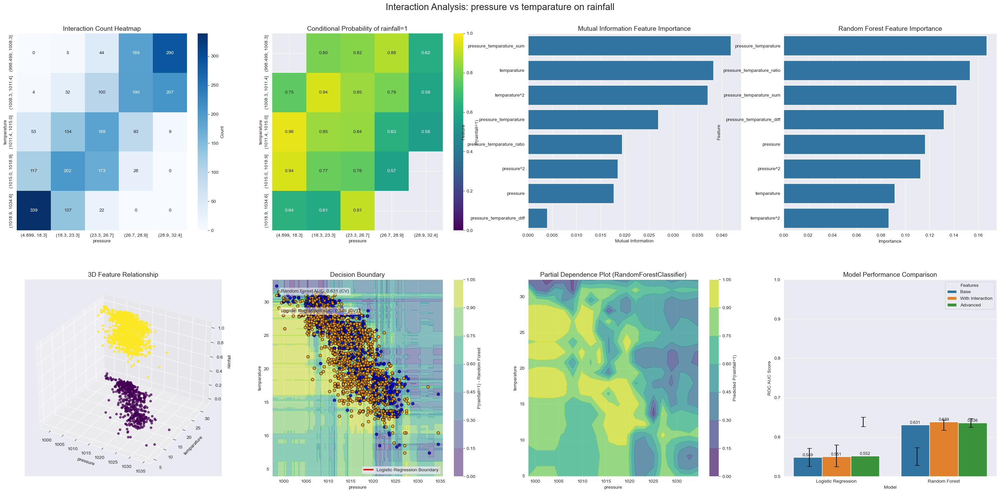


Analyzing interaction between pressure and cloud...


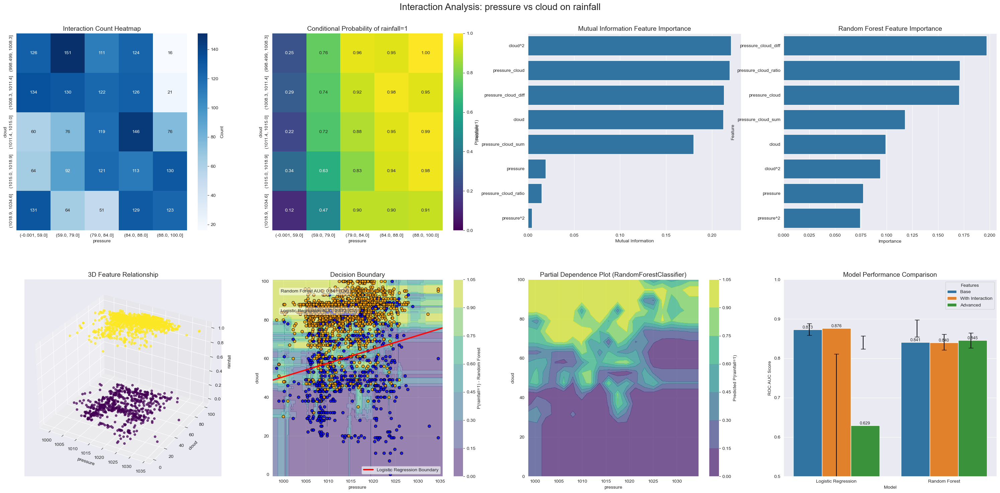


Analyzing interaction between pressure and sunshine...


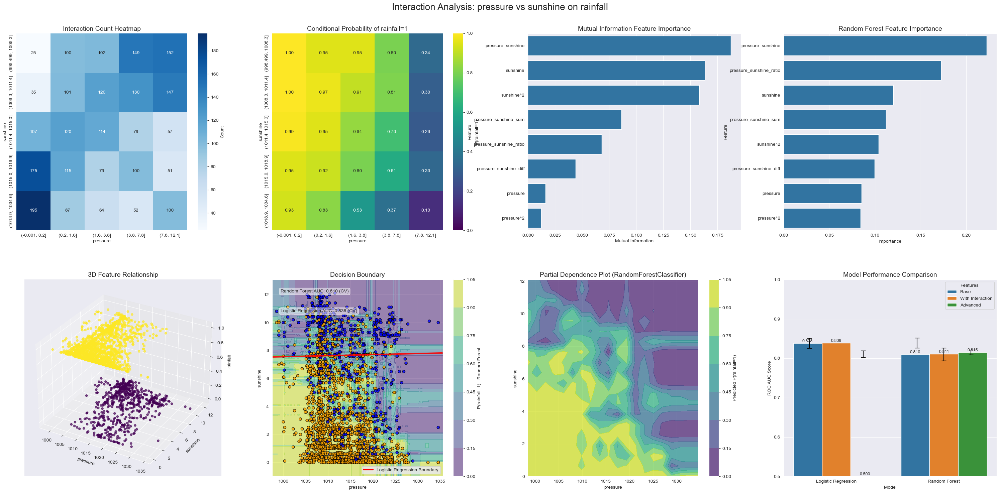


Analyzing interaction between pressure and humidity...


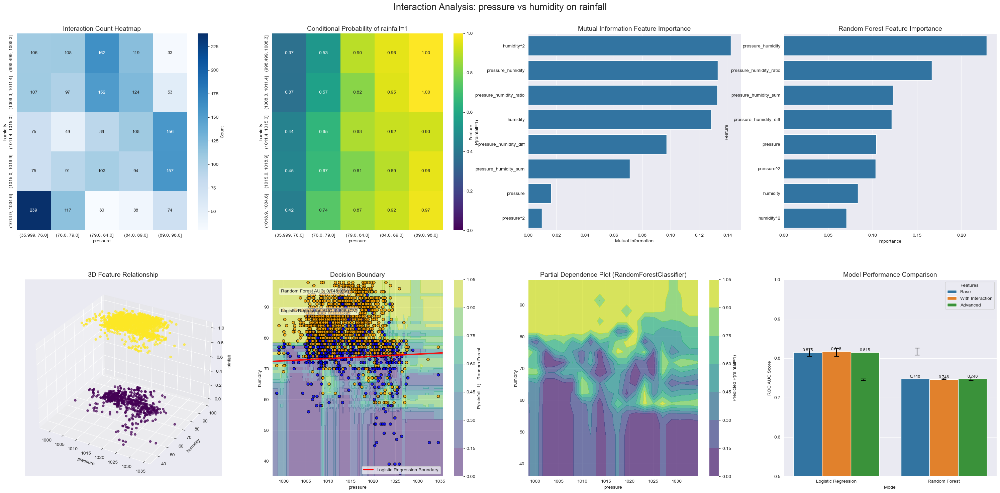


Analyzing interaction between pressure and windspeed...


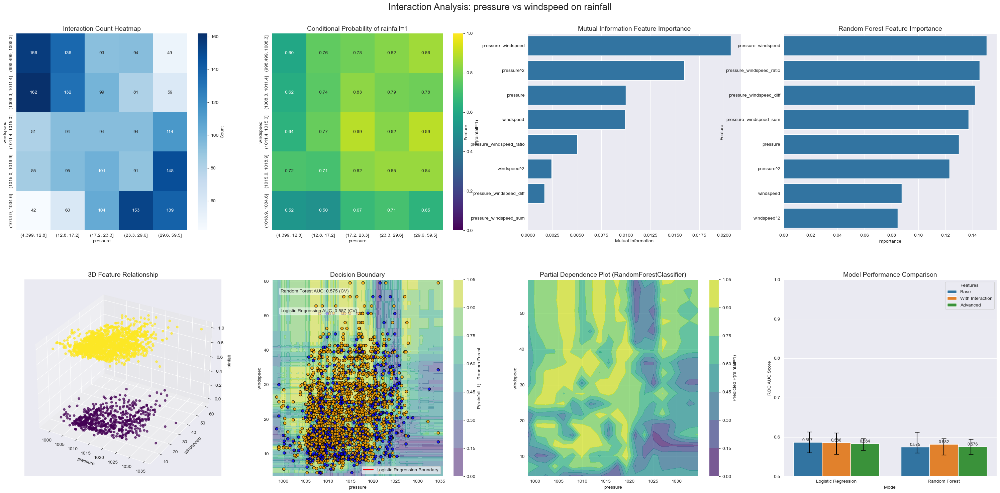


Analyzing interaction between temparature and cloud...


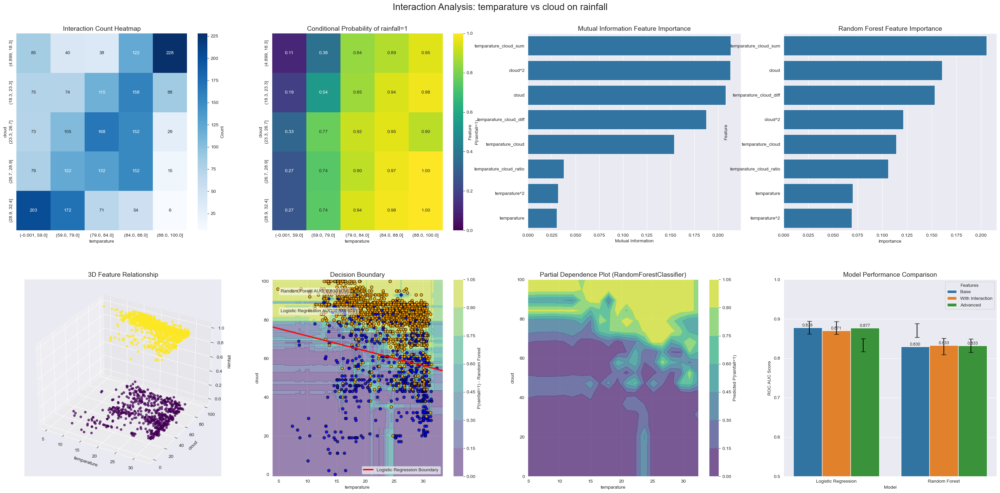


Analyzing interaction between temparature and sunshine...


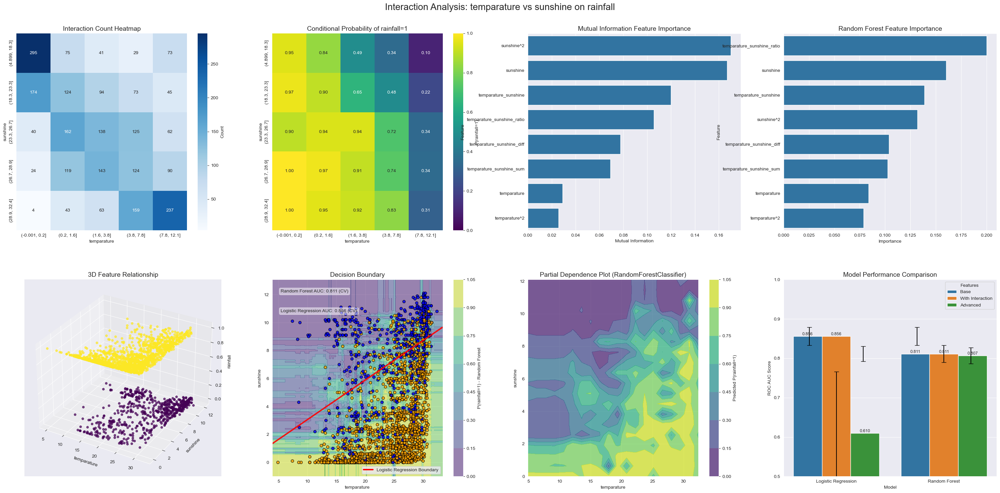


Analyzing interaction between temparature and humidity...


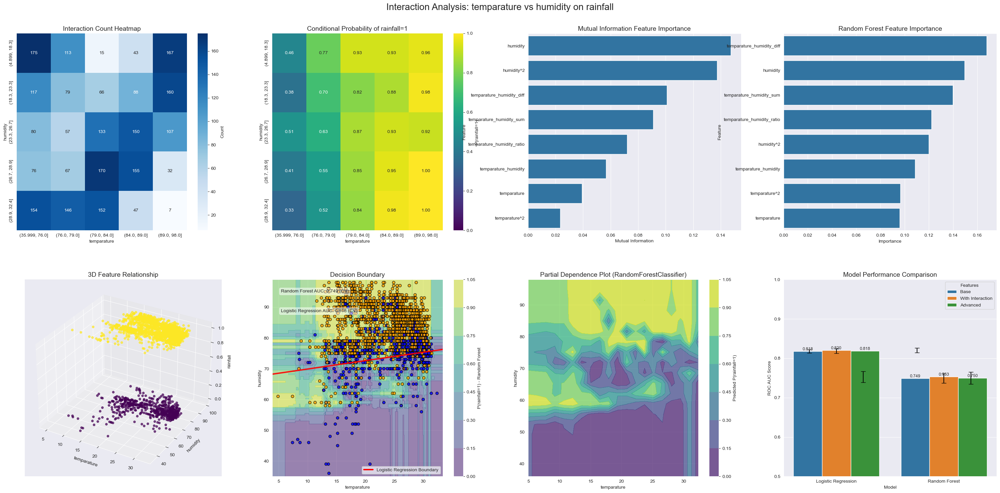


Analyzing interaction between temparature and windspeed...


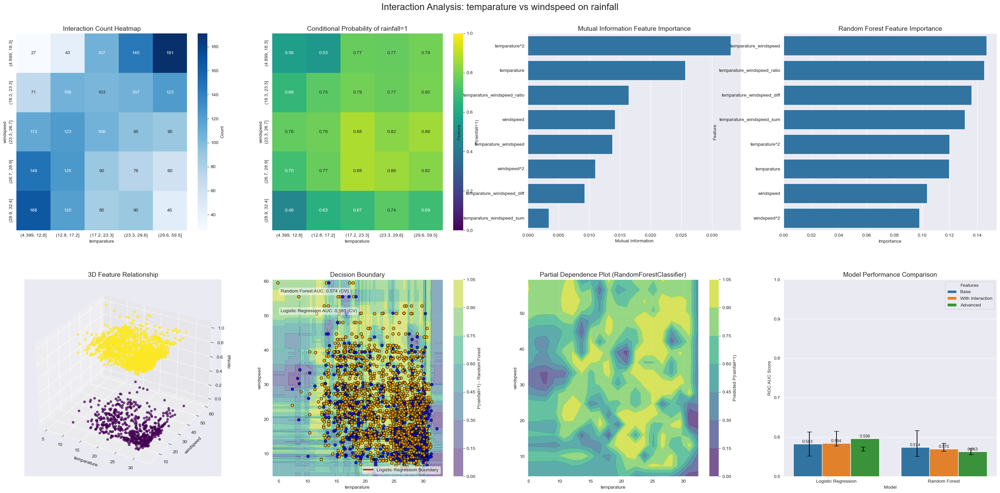


Analyzing interaction between cloud and sunshine...


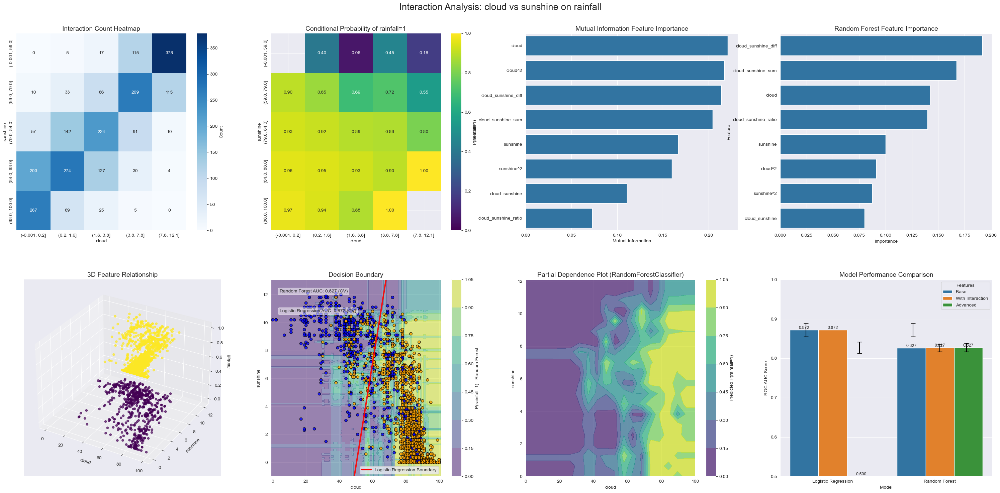


Analyzing interaction between cloud and humidity...


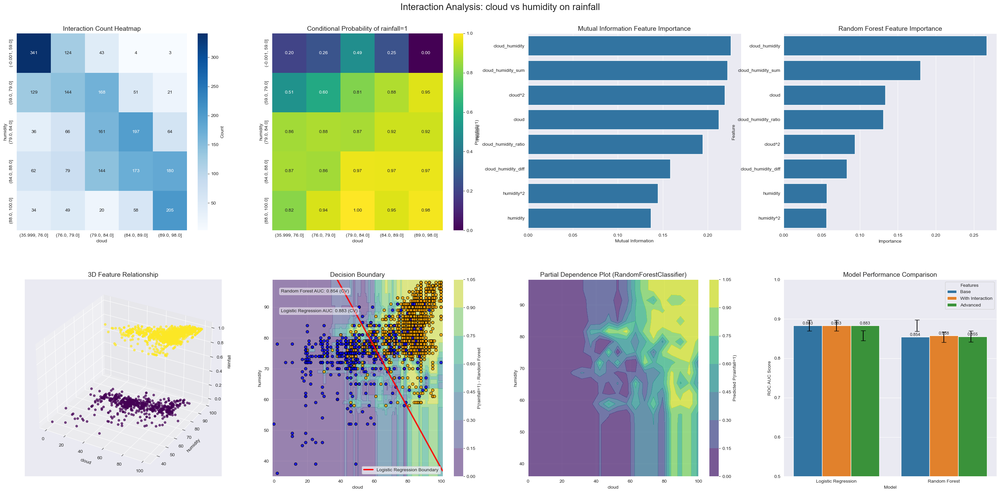


Analyzing interaction between cloud and windspeed...


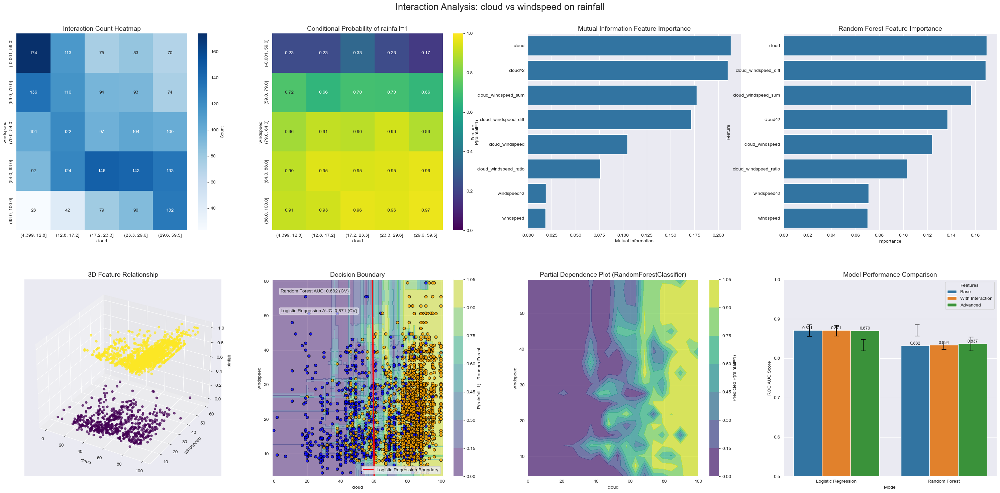


Analyzing interaction between sunshine and humidity...


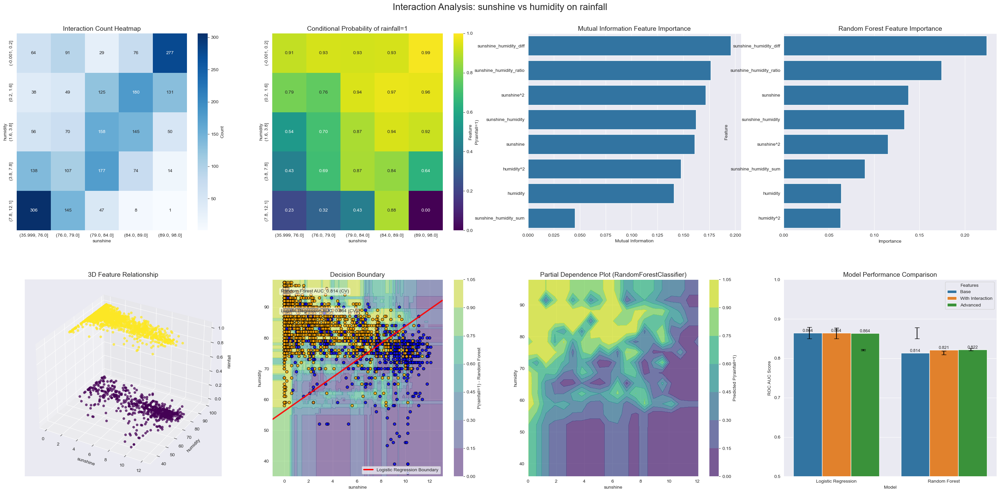


Analyzing interaction between sunshine and windspeed...


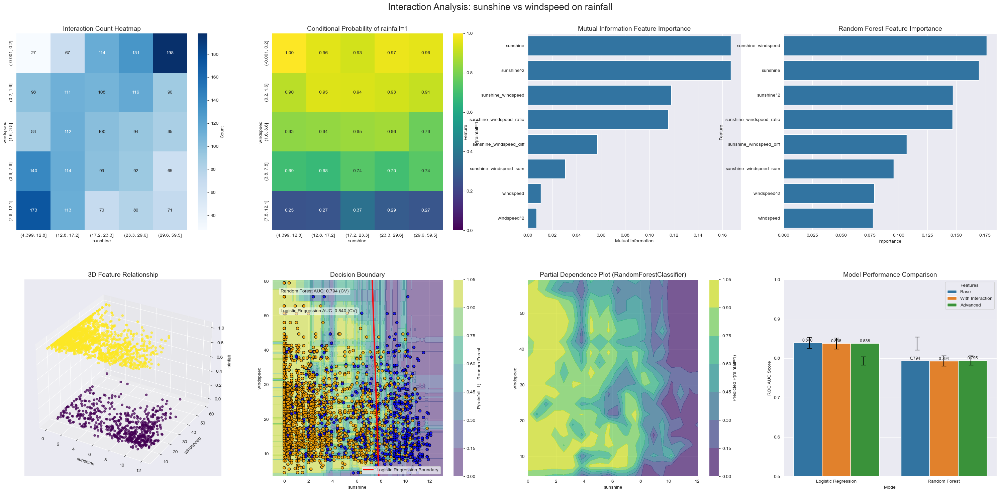


Analyzing interaction between humidity and windspeed...


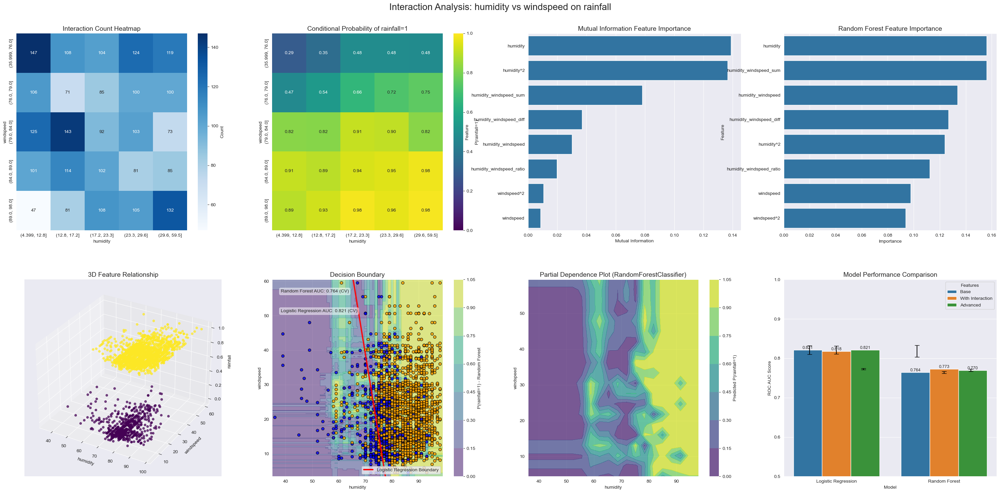

       Feature1     Feature2  MI_Score  RF_Importance  Prob_Range  \
12     sunshine     humidity  0.162172       0.133221    0.985560   
6   temparature     sunshine  0.119863       0.138770    0.904110   
10        cloud     humidity  0.225722       0.266500    1.000000   
1      pressure        cloud  0.219269       0.170325    0.877863   
5   temparature        cloud  0.154049       0.114289    0.894118   
14     humidity    windspeed  0.030155       0.133700    0.699134   
7   temparature     humidity  0.056814       0.108588    0.668831   
9         cloud     sunshine  0.110588       0.079915    0.941176   
11        cloud    windspeed  0.104720       0.124024    0.798268   
8   temparature    windspeed  0.013782       0.146649    0.413922   
13     sunshine    windspeed  0.117824       0.176488    0.745665   
4      pressure    windspeed  0.020707       0.150445    0.394737   
3      pressure     humidity  0.133108       0.228020    0.632075   
2      pressure     sunshine  0.18

In [9]:
class FeatureInteractionAnalyzer:
    """Class for analyzing feature interactions for binary classification."""

    def __init__(self, data, features, target):
        """Initialize with dataset, feature list, and target variable."""
        self.data = data.copy()
        self.features = features
        self.target = target
        self.enhanced_data = None

        # Define regression models
        self.regression_models = {
            'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
            # 'Ridge Regression': RidgeClassifier(random_state=42, alpha=1.0)
        }

        # Define tree-based models
        self.tree_models = {
            'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
            # 'LGBM Classifier': LGBMClassifier(n_estimators=100, random_state=42)
        }

    def get_proba(self, model, X):
        """Get probability predictions for different types of models."""
        if hasattr(model, 'predict_proba'):
            return model.predict_proba(X)[:, 1]
        elif hasattr(model, 'decision_function'):
            # Normalize decision function to [0, 1] range
            scores = model.decision_function(X)
            scores = (scores - scores.min()) / (scores.max() - scores.min())
            return scores
        else:
            # Fallback
            return model.predict(X).astype(float)

    def create_interaction_terms(self, degree=2):
        """Create polynomial and custom interaction features."""
        if self.enhanced_data is not None:
            return self.enhanced_data

        data = self.data.copy()

        # Create polynomial features
        poly = PolynomialFeatures(degree=degree, include_bias=False)
        poly_features = poly.fit_transform(data[self.features])
        feature_names = poly.get_feature_names_out(self.features)

        # Add interaction terms (only those with underscores when spaces are replaced)
        for i, name in enumerate(feature_names):
            formatted_name = name.replace(' ', '_')
            if '_' in formatted_name:  # Only add interaction terms
                data[formatted_name] = poly_features[:, i]

        # Add custom interactions (ratios, sums, differences)
        for feat1, feat2 in combinations(self.features, 2):
            data[f'{feat1}_{feat2}_ratio'] = data[feat1] / (data[feat2] + 1e-10)
            data[f'{feat1}_{feat2}_sum'] = data[feat1] + data[feat2]
            data[f'{feat1}_{feat2}_diff'] = data[feat1] - data[feat2]

        self.enhanced_data = data
        return data

    def plot_partial_dependence(self, ax, data, feature1, feature2, target, model=None, grid_size=20):
        """Create a partial dependence plot showing how the target depends on both features."""
        # Use provided model or get the first tree model
        if model is None:
            _, model = next(iter(self.tree_models.items()))

        # Train the model
        model = model.__class__(**model.get_params())
        model.fit(data[[feature1, feature2]], data[target])

        # Create grids for feature1 and feature2
        f1_values = np.linspace(data[feature1].min(), data[feature1].max(), grid_size)
        f2_values = np.linspace(data[feature2].min(), data[feature2].max(), grid_size)

        # Create a meshgrid
        f1_grid, f2_grid = np.meshgrid(f1_values, f2_values)

        # Create the test points
        test_points = np.column_stack([f1_grid.ravel(), f2_grid.ravel()])

        # Get predictions
        y_pred = self.get_proba(model, test_points)

        # Reshape for plotting
        y_pred = y_pred.reshape(grid_size, grid_size)

        # Plot as a contour plot
        contour = ax.contourf(f1_grid, f2_grid, y_pred, cmap='viridis', alpha=0.7)

        # Add a colorbar
        plt.colorbar(contour, ax=ax, label=f'Predicted P({target}=1)')

        # Add feature names as labels
        ax.set_xlabel(feature1)
        ax.set_ylabel(feature2)

        # Add a title with model name
        model_name = type(model).__name__
        ax.set_title(f'Partial Dependence Plot ({model_name})', fontsize=14)

        return contour

    def evaluate_interaction_performance(self, data, feature1, feature2, target):
        """Compare model performance with and without interaction features."""
        # Dictionary to store results
        results = {}

        # Create dataset variations once
        X_base = data[[feature1, feature2]]

        # Create interaction terms
        X_with_interaction = X_base.copy()
        X_with_interaction[f'{feature1}_{feature2}'] = data[feature1] * data[feature2]

        # Create advanced interactions
        X_advanced = X_with_interaction.copy()
        X_advanced[f'{feature1}_{feature2}_ratio'] = data[feature1] / (data[feature2] + 1e-10)
        X_advanced[f'{feature1}_{feature2}_sum'] = data[feature1] + data[feature2]
        X_advanced[f'{feature1}_{feature2}_diff'] = data[feature1] - data[feature2]
        X_advanced[f'{feature1}^2'] = data[feature1] ** 2
        X_advanced[f'{feature2}^2'] = data[feature2] ** 2

        y = data[target]

        # Combine all models
        all_models = {}
        all_models.update(self.regression_models)
        all_models.update(self.tree_models)

        # Get the same models used in the decision boundary
        tree_model_name, tree_model_class = next(iter(self.tree_models.items()))
        reg_model_name, reg_model_class = next(iter(self.regression_models.items()))

        # Create a KFold object
        kf = KFold(n_splits=3, shuffle=True, random_state=42)

        # Keep track of the AUC scores
        model_aucs = {}

        # Evaluate each model with different feature sets
        for model_name, model_class in all_models.items():
            # Base features only
            base_scores = cross_val_score(model_class, X_base, y, cv=kf, scoring='roc_auc')

            # With basic interaction
            interaction_scores = cross_val_score(model_class, X_with_interaction, y, cv=kf, scoring='roc_auc')

            # With all advanced interactions
            advanced_scores = cross_val_score(model_class, X_advanced, y, cv=kf, scoring='roc_auc')

            # Store results
            results[model_name] = {
                'Base': base_scores.mean(),
                'With Interaction': interaction_scores.mean(),
                'Advanced': advanced_scores.mean(),
                'Base_std': base_scores.std(),
                'Interaction_std': interaction_scores.std(),
                'Advanced_std': advanced_scores.std()
            }

            # For specific models, store AUC
            if model_name == tree_model_name:
                model_aucs['tree_model'] = base_scores.mean()
            if model_name == reg_model_name:
                model_aucs['reg_model'] = base_scores.mean()

        # Train models for visualization (full dataset)
        tree_model = tree_model_class.__class__(**tree_model_class.get_params())
        tree_model.fit(X_base, y)

        reg_model = reg_model_class.__class__(**reg_model_class.get_params())
        reg_model.fit(X_base, y)

        # Add trained models
        model_aucs['trained_tree_model'] = tree_model
        model_aucs['trained_reg_model'] = reg_model

        return results, model_aucs

    def plot_interaction_performance_comparison(self, ax, data, feature1, feature2, target):
        """Plot performance comparison with and without interactions."""
        # Get performance metrics
        performance, model_aucs = self.evaluate_interaction_performance(data, feature1, feature2, target)

        # Prepare data for plotting
        model_names = list(performance.keys())
        feature_sets = ['Base', 'With Interaction', 'Advanced']

        # Create DataFrame for plotting
        plot_data = []
        for model in model_names:
            for feature_set in feature_sets:
                std_key = f'{feature_set}_std' if feature_set != 'With Interaction' else 'Interaction_std'
                plot_data.append({
                    'Model': model,
                    'Features': feature_set,
                    'AUC': performance[model][feature_set],
                    'Std': performance[model][std_key]
                })

        plot_df = pd.DataFrame(plot_data)

        # Create grouped bar plot
        sns.barplot(x='Model', y='AUC', hue='Features', data=plot_df, ax=ax)

        # Add error bars
        for i, row in enumerate(plot_df.itertuples()):
            ax.errorbar(x=i % len(model_names) + (i // len(model_names) - 1) * 0.25,
                        y=row.AUC, yerr=row.Std, fmt='none', c='black', capsize=5)

        # Add title and labels
        ax.set_title('Model Performance Comparison', fontsize=14)
        ax.set_ylabel('ROC AUC Score')
        ax.set_ylim(0.5, 1.0)  # AUC is between 0.5 and 1

        # Add value labels on bars
        for i, p in enumerate(ax.patches):
            ax.annotate(f'{p.get_height():.3f}',
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='bottom', fontsize=9)

        return plot_df, model_aucs

    def plot_feature_interaction(self, feature1, feature2, bins=5):
        """Create a comprehensive visualization of feature interactions with advanced diagnostic plots."""
        # Use enhanced data if available, otherwise use original
        data = self.enhanced_data if self.enhanced_data is not None else self.create_interaction_terms()

        # Setup the figure
        fig = plt.figure(figsize=(30, 15))
        fig.suptitle(f'Interaction Analysis: {feature1} vs {feature2} on {self.target}', fontsize=20)
        gs = fig.add_gridspec(2, 4)

        # Ensure interaction column exists
        interaction_col = f'{feature1}_{feature2}'
        if interaction_col not in data.columns:
            data[interaction_col] = data[feature1] * data[feature2]

        # Create bins for both features - using the same bins for both heatmaps
        data_copy = data.copy()
        try:
            # Using quantile-based bins for more balanced bin sizes
            data_copy[f'{feature1}_bin'] = pd.qcut(data_copy[feature1], q=bins, duplicates='drop')
            data_copy[f'{feature2}_bin'] = pd.qcut(data_copy[feature2], q=bins, duplicates='drop')
        except ValueError:
            # Fall back to equal-width bins if qcut fails
            data_copy[f'{feature1}_bin'] = pd.cut(data_copy[feature1], bins=bins)
            data_copy[f'{feature2}_bin'] = pd.cut(data_copy[feature2], bins=bins)

        # 1. HEATMAP SECTION - Row 1, Columns 0-1
        # 1A. Interaction Heatmap (counts) - Row 1, Column 0
        ax_count_heatmap = fig.add_subplot(gs[0, 0])
        count_values = None
        try:
            # Calculate counts per bin
            count_values = data_copy.groupby([f'{feature1}_bin', f'{feature2}_bin'],
                                             observed=False).size().unstack()

            # Plot count heatmap
            sns.heatmap(count_values, ax=ax_count_heatmap, cmap='Blues',
                        annot=True, fmt='d', cbar_kws={'label': 'Count'})
            ax_count_heatmap.set_title('Interaction Count Heatmap', fontsize=14)
            ax_count_heatmap.set_xlabel(feature1)
            ax_count_heatmap.set_ylabel(feature2)
        except Exception as e:
            ax_count_heatmap.text(0.5, 0.5, f"Could not create count heatmap: {str(e)}",
                                  ha='center', va='center')

        # 1B. Conditional Probability Heatmap - Row 1, Column 1
        ax_prob = fig.add_subplot(gs[0, 1])
        cond_prob = None
        try:
            # Calculate conditional probability of target=1 given feature bins
            cond_prob = data_copy.groupby([f'{feature1}_bin', f'{feature2}_bin'],
                                          observed=False)[self.target].mean().unstack()

            # Plot probability heatmap - same binning as count heatmap
            sns.heatmap(cond_prob, ax=ax_prob, cmap='viridis', vmin=0, vmax=1,
                        annot=True, fmt='.2f', cbar_kws={'label': f'P({self.target}=1)'})
            ax_prob.set_title(f'Conditional Probability of {self.target}=1', fontsize=14)
            ax_prob.set_xlabel(feature1)
            ax_prob.set_ylabel(feature2)
        except Exception as e:
            ax_prob.text(0.5, 0.5, f"Could not create probability plot: {str(e)}",
                         ha='center', va='center')

        # 2. FEATURE IMPORTANCE SECTION - Row 1, Columns 2-3
        # Create columns for importance analysis
        ratio_col = f'{feature1}_{feature2}_ratio'
        sum_col = f'{feature1}_{feature2}_sum'
        diff_col = f'{feature1}_{feature2}_diff'

        # Select features for importance analysis
        feature_cols = [feature1, feature2, interaction_col, ratio_col, sum_col, diff_col]

        # Add squared terms if needed
        for feat in [feature1, feature2]:
            sq_col = f'{feat}^2'
            if sq_col not in data.columns:
                data[sq_col] = data[feat] ** 2
            feature_cols.append(sq_col)

        # Prepare data for importance calculation
        X = data[feature_cols]

        # 2A. Mutual Information Importance - Row 1, Column 2
        ax_mi = fig.add_subplot(gs[0, 2])
        mi_scores = mutual_info_classif(X, data[self.target])
        mi_df = pd.DataFrame({'Feature': X.columns, 'Mutual Information': mi_scores})
        mi_df = mi_df.sort_values('Mutual Information', ascending=False)

        sns.barplot(x='Mutual Information', y='Feature', data=mi_df, ax=ax_mi)
        ax_mi.set_title('Mutual Information Feature Importance', fontsize=14)

        # 2B. Random Forest Feature Importance - Row 1, Column 3
        ax_rf = fig.add_subplot(gs[0, 3])

        # Train Random Forest once for feature importance
        rf = RandomForestClassifier(n_estimators=100, random_state=42)
        rf.fit(X, data[self.target])

        rf_importance = pd.DataFrame({
            'Feature': X.columns,
            'Importance': rf.feature_importances_
        }).sort_values('Importance', ascending=False)

        sns.barplot(x='Importance', y='Feature', data=rf_importance, ax=ax_rf)
        ax_rf.set_title('Random Forest Feature Importance', fontsize=14)

        # 3. VISUALIZATION SECTION - Row 2
        # 3A. 3D Scatter Plot - Row 2, Column 0
        ax3d = fig.add_subplot(gs[1, 0], projection='3d')
        ax3d.scatter(data[feature1], data[feature2], data[self.target],
                     c=data[self.target], cmap='viridis', alpha=0.7)
        ax3d.set_xlabel(feature1)
        ax3d.set_ylabel(feature2)
        ax3d.set_zlabel(self.target)
        ax3d.set_title('3D Feature Relationship', fontsize=14)

        # 3B. Decision Boundary Plot - Row 2, Column 1
        ax_decision = fig.add_subplot(gs[1, 1])

        # Get model performance metrics once
        _, model_aucs = self.evaluate_interaction_performance(data, feature1, feature2, self.target)

        # Get the pre-trained models and AUC scores
        tree_model_name, _ = next(iter(self.tree_models.items()))
        reg_model_name, _ = next(iter(self.regression_models.items()))

        tree_auc = model_aucs.get('tree_model', 0)
        reg_auc = model_aucs.get('reg_model', 0)

        tree_model = model_aucs.get('trained_tree_model')
        reg_model = model_aucs.get('trained_reg_model')

        # Create a mesh grid for the decision boundary
        h = 0.02  # Step size in the mesh
        x_min, x_max = data[feature1].min() - 1, data[feature1].max() + 1
        y_min, y_max = data[feature2].min() - 1, data[feature2].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        # Predict on the mesh grid for tree model
        Z_tree = self.get_proba(tree_model, np.c_[xx.ravel(), yy.ravel()])
        Z_tree = Z_tree.reshape(xx.shape)

        # Predict on the mesh grid for regression model
        Z_reg = self.get_proba(reg_model, np.c_[xx.ravel(), yy.ravel()])
        Z_reg = Z_reg.reshape(xx.shape)

        # Plot the tree model decision boundary
        contourf = ax_decision.contourf(xx, yy, Z_tree, alpha=0.5, cmap='viridis')
        plt.colorbar(contourf, ax=ax_decision, label=f'P({self.target}=1) - {tree_model_name}')

        # Plot the regression model decision boundary as a single contour at 0.5 threshold
        ax_decision.contour(xx, yy, Z_reg, levels=[0.5], alpha=0.9, colors='red', linewidths=3)

        # Add a label for the regression contour line
        ax_decision.plot([], [], color='red', linewidth=3, label=f'{reg_model_name} Boundary')
        ax_decision.legend(loc='lower right')

        # Overlay the actual data points
        ax_decision.scatter(data[feature1], data[feature2], c=data[self.target],
                            edgecolor='k', alpha=0.8, cmap=ListedColormap(['blue', 'orange']))

        # Add ROC AUC scores to the plot - these are cross-validated scores
        ax_decision.text(0.05, 0.95, f"{tree_model_name} AUC: {tree_auc:.3f} (CV)",
                         transform=ax_decision.transAxes, fontsize=10,
                         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        ax_decision.text(0.05, 0.85, f"{reg_model_name} AUC: {reg_auc:.3f} (CV)",
                         transform=ax_decision.transAxes, fontsize=10,
                         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        ax_decision.set_xlabel(feature1)
        ax_decision.set_ylabel(feature2)
        ax_decision.set_title('Decision Boundary', fontsize=14)

        # 3C. Partial Dependence Plot - Row 2, Column 2
        ax_pdp = fig.add_subplot(gs[1, 2])
        try:
            # Get the first tree model for partial dependence
            tree_model_name, tree_model = next(iter(self.tree_models.items()))
            self.plot_partial_dependence(ax_pdp, data, feature1, feature2, self.target, model=tree_model)
        except Exception as e:
            ax_pdp.text(0.5, 0.5, f"Could not create partial dependence plot: {str(e)}",
                        ha='center', va='center')

        # 3D. Model Performance Comparison - Row 2, Column 3
        ax_perf = fig.add_subplot(gs[1, 3])
        perf_data = model_aucs = None
        try:
            perf_data, model_aucs = self.plot_interaction_performance_comparison(ax_perf, data, feature1, feature2, self.target)
        except Exception as e:
            ax_perf.text(0.5, 0.5, f"Could not create performance comparison: {str(e)}",
                         ha='center', va='center')

        plt.tight_layout()
        plt.subplots_adjust(top=0.92, hspace=0.25, wspace=0.2)
        plt.show()

        # Return metrics for further analysis
        return {
            'mutual_info': mi_df,
            'rf_importance': rf_importance,
            'conditional_prob': cond_prob,
            'bin_counts': count_values,
            'performance_comparison': perf_data,
            'model_aucs': {
                tree_model_name: tree_auc,
                reg_model_name: reg_auc
            }
        }

    def analyze_all_interactions(self, degree=2):
        """Analyze all pairwise feature interactions."""
        # Create interaction terms if not already done
        if self.enhanced_data is None:
            self.create_interaction_terms(degree=degree)

        # Dictionary to store metrics
        interaction_metrics = {}

        # Analyze each feature pair
        for feat1, feat2 in combinations(self.features, 2):
            print(f"\nAnalyzing interaction between {feat1} and {feat2}...")

            try:
                # Plot and get metrics
                metrics = self.plot_feature_interaction(feat1, feat2)
                interaction_metrics[(feat1, feat2)] = metrics
            except Exception as e:
                print(f"Error analyzing {feat1} and {feat2}: {e}")
                continue

        return interaction_metrics

    def get_top_interactions(self, metrics, metric_type='mutual_info', n=5):
        """Get top feature interactions based on specified metric."""
        results = []

        for (feat1, feat2), data in metrics.items():
            if metric_type not in data:
                continue

            # Find the interaction term
            interaction_col = f'{feat1}_{feat2}'

            if metric_type == 'mutual_info':
                df = data[metric_type]
                col_name = 'Mutual Information'
            elif metric_type == 'rf_importance':
                df = data[metric_type]
                col_name = 'Importance'

            # Extract value for interaction term
            interaction_row = df[df['Feature'] == interaction_col]
            if not interaction_row.empty:
                value = interaction_row[col_name].values[0]
                results.append({
                    'Feature1': feat1,
                    'Feature2': feat2,
                    'Value': value
                })

        # Create and return sorted DataFrame
        if results:
            return pd.DataFrame(results).sort_values('Value', ascending=False).head(n)
        else:
            return pd.DataFrame(columns=['Feature1', 'Feature2', 'Value'])

    def calculate_interaction_gain(self, X, y, feature1, feature2):
        """Calculate the interaction gain (how much better two features predict together vs. individually)."""


        # Model with just feature 1
        model1 = LogisticRegression(max_iter=1000)
        model1.fit(X[[feature1]], y)
        y_pred1 = model1.predict_proba(X[[feature1]])[:, 1]
        auc1 = roc_auc_score(y, y_pred1)

        # Model with just feature 2
        model2 = LogisticRegression(max_iter=1000)
        model2.fit(X[[feature2]], y)
        y_pred2 = model2.predict_proba(X[[feature2]])[:, 1]
        auc2 = roc_auc_score(y, y_pred2)

        # Model with both features
        model_both = LogisticRegression(max_iter=1000)
        model_both.fit(X[[feature1, feature2]], y)
        y_pred_both = model_both.predict_proba(X[[feature1, feature2]])[:, 1]
        auc_both = roc_auc_score(y, y_pred_both)

        # Interaction gain (how much better is the combined model)
        interaction_gain = auc_both - max(auc1, auc2)

        return {
            'AUC_feature1': auc1,
            'AUC_feature2': auc2,
            'AUC_combined': auc_both,
            'interaction_gain': interaction_gain
        }

    def summarize_interactions(self, metrics):
        """Summarize all pairwise feature interactions in a single table."""
        summary_rows = []

        for (feat1, feat2), data in metrics.items():
            # Get interaction term
            interaction_col = f'{feat1}_{feat2}'

            # Extract MI and RF importance if available
            mi_value = rf_value = prob_range = int_gain = None

            if 'mutual_info' in data:
                mi_df = data['mutual_info']
                mi_row = mi_df[mi_df['Feature'] == interaction_col]
                if not mi_row.empty:
                    mi_value = mi_row['Mutual Information'].values[0]

            if 'rf_importance' in data:
                rf_df = data['rf_importance']
                rf_row = rf_df[rf_df['Feature'] == interaction_col]
                if not rf_row.empty:
                    rf_value = rf_row['Importance'].values[0]

            # Get probability range if available
            if 'conditional_prob' in data and data['conditional_prob'] is not None:
                cond_prob = data['conditional_prob']
                prob_min = cond_prob.min().min()
                prob_max = cond_prob.max().max()
                prob_range = prob_max - prob_min

            # Get model AUCs
            model_aucs = data.get('model_aucs', {})

            # Calculate interaction gain
            if self.enhanced_data is not None:
                try:
                    gain_data = self.calculate_interaction_gain(
                        self.enhanced_data[[feat1, feat2]],
                        self.enhanced_data[self.target],
                        feat1, feat2
                    )
                    int_gain = gain_data['interaction_gain']
                except Exception:
                    pass

            # Add to summary
            summary_row = {
                'Feature1': feat1,
                'Feature2': feat2,
                'MI_Score': mi_value,
                'RF_Importance': rf_value,
                'Prob_Range': prob_range,
                'Interaction_Gain': int_gain
            }

            # Add model AUCs to the summary
            for model_name, auc in model_aucs.items():
                summary_row[f'{model_name}_AUC'] = auc

            summary_rows.append(summary_row)

        # Create summary DataFrame
        summary_df = pd.DataFrame(summary_rows)

        # Sort by interaction gain if available, otherwise MI score
        if 'Interaction_Gain' in summary_df.columns and not summary_df['Interaction_Gain'].isna().all():
            summary_df = summary_df.sort_values('Interaction_Gain', ascending=False)
        elif 'MI_Score' in summary_df.columns and not summary_df['MI_Score'].isna().all():
            summary_df = summary_df.sort_values('MI_Score', ascending=False)

        return summary_df

# Example usage:
analyzer = FeatureInteractionAnalyzer(train, original_features, 'rainfall')
enhanced_data = analyzer.create_interaction_terms()
metrics = analyzer.analyze_all_interactions()
summary = analyzer.summarize_interactions(metrics)
print(summary)

# Anomaly Detection
We will use the following methods:
- Isolation Forest
- Local Outlier Factor
- One-Class SVM
- Elliptic Envelope
- DBSCAN

---

This is a class that can be used to visualize time series data with anomaly detection and target classification.
- It combines scatter plots of time series data (colored by target variable) with various anomaly detection methods.

['IF', 'LOF', 'OCSVM', 'EE', 'DBSCAN']


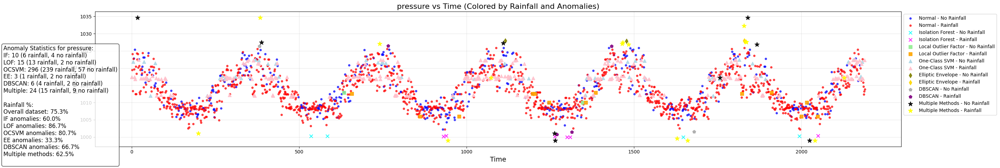

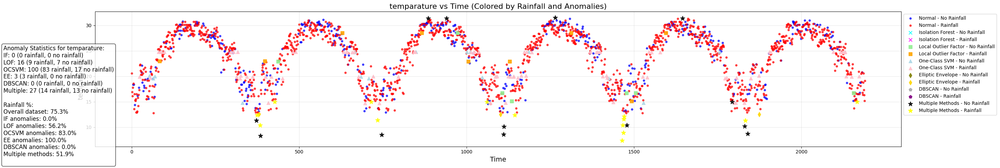

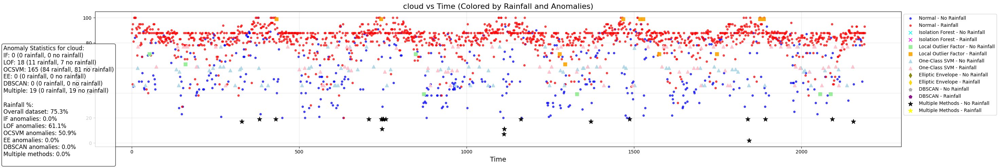

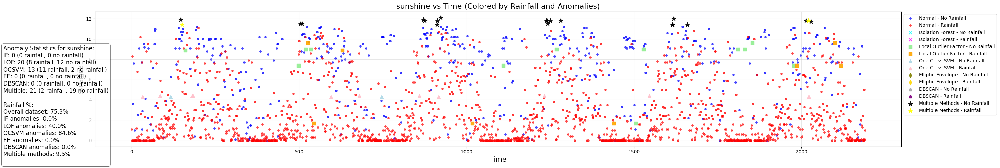

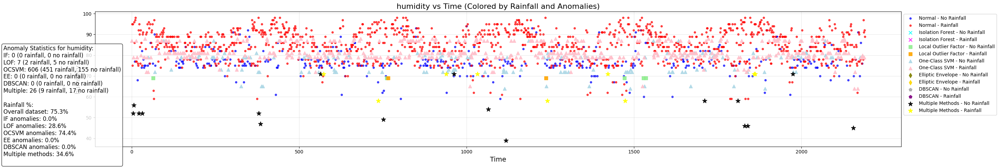

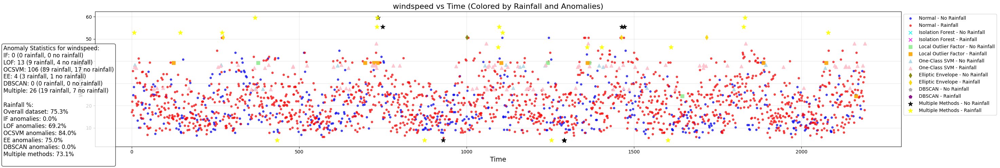

In [10]:
class TimeSeriesAnomalyVisualizer:
    """
    Class for visualizing time series data with anomaly detection and target classification.

    This class combines scatter plots of time series data (colored by target variable)
    with various anomaly detection methods.
    """

    def __init__(self, contamination=0.01, n_neighbors=20, figsize=(30, 5)):
        """
        Initialize the TimeSeriesAnomalyVisualizer.

        Parameters:
        -----------
        contamination : float, default=0.01
            The expected proportion of outliers in the data for anomaly detection
        n_neighbors : int, default=20
            Number of neighbors for Local Outlier Factor
        figsize : tuple, default=(30, 5)
            Default figure size for plots
        """
        self.contamination = contamination
        self.n_neighbors = n_neighbors
        self.figsize = figsize
        self.stats = {}

        # Define the available anomaly detection methods
        self.available_methods = {
            'IF': self._isolation_forest,
            'LOF': self._local_outlier_factor,
            'OCSVM': self._one_class_svm,
            'EE': self._elliptic_envelope,
            'DBSCAN': self._dbscan
        }

        # Define color and marker schemes for visualization
        self.method_colors = {
            'IF': ('cyan', 'magenta'),
            'LOF': ('lightgreen', 'orange'),
            'OCSVM': ('lightblue', 'pink'),
            'EE': ('olive', 'gold'),
            'DBSCAN': ('darkgrey', 'purple')
        }

        self.method_markers = {
            'IF': 'x',
            'LOF': 's',
            'OCSVM': '^',
            'EE': 'd',
            'DBSCAN': 'p'
        }

        # Define method full names for legend
        self.method_names = {
            'IF': 'Isolation Forest',
            'LOF': 'Local Outlier Factor',
            'OCSVM': 'One-Class SVM',
            'EE': 'Elliptic Envelope',
            'DBSCAN': 'DBSCAN'
        }

    def _isolation_forest(self, X):
        """
        Detect anomalies using Isolation Forest.

        Parameters:
        -----------
        X : array-like of shape (n_samples, n_features)
            The input samples.

        Returns:
        --------
        array : Boolean array, True for anomalies
        """
        try:
            clf = IsolationForest(contamination=self.contamination, random_state=42)
            return clf.fit_predict(X) == -1
        except Exception as e:
            print(f"Warning: Isolation Forest failed - {str(e)}")
            return np.zeros(len(X), dtype=bool)

    def _local_outlier_factor(self, X):
        """
        Detect anomalies using Local Outlier Factor.

        Parameters:
        -----------
        X : array-like of shape (n_samples, n_features)
            The input samples.

        Returns:
        --------
        array : Boolean array, True for anomalies
        """
        try:
            clf = LocalOutlierFactor(n_neighbors=min(self.n_neighbors, len(X)-1),
                                     contamination=self.contamination)
            return clf.fit_predict(X) == -1
        except Exception as e:
            print(f"Warning: Local Outlier Factor failed - {str(e)}")
            return np.zeros(len(X), dtype=bool)

    def _one_class_svm(self, X):
        """
        Detect anomalies using One-Class SVM.

        Parameters:
        -----------
        X : array-like of shape (n_samples, n_features)
            The input samples.

        Returns:
        --------
        array : Boolean array, True for anomalies
        """
        try:
            # Convert DataFrame to numpy array if needed
            if hasattr(X, 'to_numpy'):
                X_np = X.to_numpy()
            else:
                X_np = np.array(X)

            clf = OneClassSVM(nu=min(self.contamination, 0.99), kernel="rbf", gamma='scale')
            return clf.fit_predict(X_np) == -1
        except Exception as e:
            print(f"Warning: One-Class SVM failed - {str(e)}")
            return np.zeros(len(X), dtype=bool)

    def _elliptic_envelope(self, X):
        """
        Detect anomalies using Robust Covariance (Elliptic Envelope).

        Parameters:
        -----------
        X : array-like of shape (n_samples, n_features)
            The input samples.

        Returns:
        --------
        array : Boolean array, True for anomalies
        """
        try:
            clf = EllipticEnvelope(contamination=self.contamination, random_state=42)
            return clf.fit_predict(X) == -1
        except Exception as e:
            # Elliptic Envelope can fail with singular covariance matrix
            print(f"Warning: Elliptic Envelope failed - {str(e)}")
            return np.zeros(X.shape[0], dtype=bool)

    def _dbscan(self, X):
        """
        Detect anomalies using DBSCAN clustering.

        Parameters:
        -----------
        X : array-like of shape (n_samples, n_features)
            The input samples.

        Returns:
        --------
        array : Boolean array, True for anomalies
        """
        try:
            # Convert DataFrame to numpy array if needed
            if hasattr(X, 'to_numpy'):
                X_np = X.to_numpy()
            else:
                X_np = np.array(X)

            # Early exit for too few samples
            if len(X_np) < 10:
                print("Warning: Too few samples for DBSCAN. Skipping.")
                return np.zeros(len(X), dtype=bool)

            # For safety, ensure we have 2D data
            if X_np.ndim == 1:
                X_np = X_np.reshape(-1, 1)

            # Standard deviation approach as a fallback
            def std_outliers(X_data):
                if np.std(X_data) == 0:  # All values identical
                    return np.zeros(len(X_data), dtype=bool)
                # Mark points > 3 std dev from mean as outliers
                mean = np.mean(X_data)
                std = np.std(X_data)
                return np.abs(X_data.ravel() - mean) > 3 * std

            # Calculate eps for DBSCAN - a simpler, more robust approach
            # Instead of trying to be clever with percentiles, we'll use a simple rule
            # based on the standard deviation of distances between points

            # Flatten data for easier handling if 1D
            if X_np.shape[1] == 1:
                # Simple approach: sort the data and find local density
                # Sort values
                sorted_vals = np.sort(X_np.ravel())
                # Calculate differences
                diffs = np.diff(sorted_vals)

                # If all values are the same or too close
                if np.all(diffs < 1e-10):
                    print("Warning: All values too similar for DBSCAN. Using standard deviation approach.")
                    return std_outliers(X_np)

                # Use median of non-zero diffs as a base for eps
                non_zero_diffs = diffs[diffs > 0]
                if len(non_zero_diffs) == 0:
                    eps = 0.01  # Default
                else:
                    eps = np.median(non_zero_diffs) * 3  # Scale factor
            else:
                # For multi-dimensional data: use average distance to nearest neighbor
                from scipy.spatial import distance_matrix

                # Calculate pairwise distances
                try:
                    # Limit computation for large datasets
                    if len(X_np) > 1000:
                        sample_idx = np.random.choice(len(X_np), 1000, replace=False)
                        dist_matrix = distance_matrix(X_np[sample_idx], X_np[sample_idx])
                    else:
                        dist_matrix = distance_matrix(X_np, X_np)

                    # Set diagonal to infinity to ignore self-distances
                    np.fill_diagonal(dist_matrix, np.inf)

                    # Get minimum distance for each point (nearest neighbor)
                    min_dists = np.min(dist_matrix, axis=1)

                    # Use median of minimum distances as eps
                    if np.all(np.isinf(min_dists)):
                        # All points are duplicates
                        eps = 0.01
                    else:
                        # Filter out infinities
                        finite_dists = min_dists[~np.isinf(min_dists)]
                        if len(finite_dists) == 0:
                            eps = 0.01
                        else:
                            eps = np.median(finite_dists) * 2
                except Exception as e:
                    print(f"Warning: Distance computation failed: {e}")
                    eps = 0.01

            # Ensure eps is positive and reasonable
            if eps <= 0 or np.isnan(eps):
                print("Warning: Invalid eps value calculated. Using default.")
                eps = 0.01

            # Calculate a reasonable min_samples based on dataset size
            min_samples = max(2, min(5, int(np.ceil(len(X_np) * 0.05))))

            # print(f"DBSCAN parameters: eps={eps}, min_samples={min_samples}")

            # Apply DBSCAN
            clf = DBSCAN(eps=eps, min_samples=min_samples)
            labels = clf.fit_predict(X_np)

            # Points with label -1 are considered outliers
            outliers = labels == -1

            # Ensure we detect some outliers - if none found with DBSCAN, use statistical approach
            if not np.any(outliers) and self.contamination > 0:
                print("Warning: DBSCAN found no outliers. Using statistical approach.")
                return std_outliers(X_np)

            return outliers

        except Exception as e:
            print(f"Warning: DBSCAN failed - {str(e)}")
            # Try statistical approach as fallback
            try:
                return std_outliers(X_np)
            except:
                return np.zeros(len(X), dtype=bool)

    def detect_anomalies(self, df, feature, methods=None):
        """
        Detect anomalies in a feature using specified methods.

        Parameters:
        -----------
        df : pandas DataFrame
            The dataframe containing the data
        feature : str
            The feature to analyze for anomalies
        methods : list or str, default=None
            Methods to use for anomaly detection. If None, uses all available methods.

        Returns:
        --------
        dict : Dictionary with anomaly masks for each method and combinations
        """
        # If methods is None, use IF and LOF (the original methods)
        if methods is None:
            methods = ['IF', 'LOF']

        # If methods is a string, convert to list
        if isinstance(methods, str):
            if methods.upper() == 'ALL':
                methods = list(self.available_methods.keys())
            else:
                methods = [methods]

        # Validate methods
        valid_methods = []
        for method in methods:
            if method.upper() in self.available_methods:
                valid_methods.append(method.upper())
            else:
                print(f"Warning: Method {method} not recognized. Skipping.")

        if not valid_methods:
            raise ValueError("No valid methods specified.")

        # Prepare the data
        try:
            X = df[[feature]]
        except KeyError:
            raise KeyError(f"Feature '{feature}' not found in dataframe. Available features: {df.columns.tolist()}")

        # Handle missing values by filling with mean
        if X.isna().any().any():
            print(f"Warning: Found {X.isna().sum().sum()} missing values in '{feature}'. Filling with mean.")
            X = X.fillna(X.mean())

        # Detect anomalies using each method
        anomaly_masks = {}
        original_masks = {}  # Store original masks before adjustments

        for method in valid_methods:
            try:
                anomaly_masks[method] = self.available_methods[method](X)
                original_masks[method] = anomaly_masks[method].copy()
            except Exception as e:
                print(f"Error in {method} method: {str(e)}")
                anomaly_masks[method] = np.zeros(len(df), dtype=bool)
                original_masks[method] = anomaly_masks[method].copy()

        # Create a mask for normal points (not detected by any method)
        normal_mask = np.ones(len(df), dtype=bool)
        for method in valid_methods:
            normal_mask = normal_mask & (~original_masks[method])

        anomaly_masks['normal'] = normal_mask

        # Create masks for points detected by multiple methods
        if len(valid_methods) > 1:
            for i, method1 in enumerate(valid_methods):
                for method2 in valid_methods[i+1:]:
                    # Points detected by both methods
                    intersection = original_masks[method1] & original_masks[method2]
                    if intersection.any():
                        anomaly_masks[f'{method1}+{method2}'] = intersection
                        # Update individual method masks to exclude intersection
                        anomaly_masks[method1] = anomaly_masks[method1] & (~intersection)
                        anomaly_masks[method2] = anomaly_masks[method2] & (~intersection)

        return anomaly_masks

    def calculate_statistics(self, df, feature, target, anomaly_masks):
        """
        Calculate statistics about anomalies and their relationship with the target variable.

        Parameters:
        -----------
        df : pandas DataFrame
            The dataframe containing the data
        feature : str
            The feature being analyzed
        target : str
            The target variable column name
        anomaly_masks : dict
            Dictionary with boolean masks for different anomaly categories

        Returns:
        --------
        dict : Statistics about anomalies by target class
        """
        # Create target masks
        target_0 = df[target] == 0
        target_1 = df[target] == 1

        # Initialize statistics dictionary
        stats = {
            'feature': feature,
            'total_points': len(df),
            'target_0_points': target_0.sum(),
            'target_1_points': target_1.sum(),
            'overall_pct_target_1': (target_1.sum() / len(df)) * 100
        }

        # Calculate statistics for each anomaly category
        for category, mask in anomaly_masks.items():
            category_total = mask.sum()
            category_target_0 = (mask & target_0).sum()
            category_target_1 = (mask & target_1).sum()

            stats[f'{category}_total'] = category_total
            stats[f'{category}_target_0'] = category_target_0
            stats[f'{category}_target_1'] = category_target_1

            if category_total > 0:
                stats[f'{category}_pct_target_1'] = (category_target_1 / category_total) * 100
            else:
                stats[f'{category}_pct_target_1'] = 0

        return stats

    def plot_feature(self, df, feature, target='rainfall', methods=None):
        """
        Create a scatter plot for a feature with points colored by target value and highlighted anomalies.

        Parameters:
        -----------
        df : pandas DataFrame
            The dataframe containing the data
        feature : str
            The feature to plot
        target : str, default='rainfall'
            The target variable column name
        methods : list or str, default=None
            Methods to use for anomaly detection. If None, uses IF and LOF.

        Returns:
        --------
        dict : Statistics about anomalies by target class
        """
        plt.figure(figsize=self.figsize)

        # Detect anomalies
        anomaly_masks = self.detect_anomalies(df, feature, methods)

        # Calculate statistics
        stats = self.calculate_statistics(df, feature, target, anomaly_masks)
        self.stats[feature] = stats

        # Create target masks
        target_0 = df[target] == 0
        target_1 = df[target] == 1

        # Plot normal points
        plt.scatter(df.index[anomaly_masks['normal'] & target_0], df.loc[anomaly_masks['normal'] & target_0, feature],
                    color='blue', label=f'Normal - No {target.capitalize()}', alpha=0.7, s=15)
        plt.scatter(df.index[anomaly_masks['normal'] & target_1], df.loc[anomaly_masks['normal'] & target_1, feature],
                    color='red', label=f'Normal - {target.capitalize()}', alpha=0.7, s=15)

        # Create a mask for multiple method detections
        multi_method_mask = np.zeros(len(df), dtype=bool)
        single_method_masks = {}

        # Separate single and multiple method detections
        for category, mask in anomaly_masks.items():
            if category == 'normal':
                continue

            if '+' in category:
                # This is a combination of methods
                multi_method_mask = multi_method_mask | mask
            else:
                # This is a single method
                single_method_masks[category] = mask

        # Plot anomalies for each single method
        for method, mask in single_method_masks.items():
            plt.scatter(df.index[mask & target_0], df.loc[mask & target_0, feature],
                        color=self.method_colors[method][0], marker=self.method_markers[method],
                        label=f'{self.method_names[method]} - No {target.capitalize()}',
                        alpha=0.9, s=50)
            plt.scatter(df.index[mask & target_1], df.loc[mask & target_1, feature],
                        color=self.method_colors[method][1], marker=self.method_markers[method],
                        label=f'{self.method_names[method]} - {target.capitalize()}',
                        alpha=0.9, s=50)

        # Plot points detected by multiple methods with a single star symbol
        if np.any(multi_method_mask):
            plt.scatter(df.index[multi_method_mask & target_0], df.loc[multi_method_mask & target_0, feature],
                        color='black', marker='*',
                        label=f'Multiple Methods - No {target.capitalize()}',
                        alpha=0.9, s=100)
            plt.scatter(df.index[multi_method_mask & target_1], df.loc[multi_method_mask & target_1, feature],
                        color='yellow', marker='*',
                        label=f'Multiple Methods - {target.capitalize()}',
                        alpha=0.9, s=100)

        plt.title(f'{feature} vs Time (Colored by {target.capitalize()} and Anomalies)', fontsize=16)
        plt.xlabel('Time', fontsize=14)
        plt.ylabel(feature, fontsize=14)
        plt.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
        plt.grid(True, alpha=0.3)

        # Display statistics in the plot using text box
        props = dict(boxstyle='round', facecolor='white', alpha=0.8)
        stats_text = f"Anomaly Statistics for {feature}:\n"

        for category, mask in anomaly_masks.items():
            if category != 'normal':
                if '+' in category:
                    continue  # Skip individual combination stats
                else:
                    method_name = category

                stats_text += f"{method_name}: {stats[f'{category}_total']} "
                stats_text += f"({stats[f'{category}_target_1']} {target}, {stats[f'{category}_target_0']} no {target})\n"

        # Add multi-method stats if any
        if np.any(multi_method_mask):
            multi_total = np.sum(multi_method_mask)
            multi_target_1 = np.sum(multi_method_mask & target_1)
            multi_target_0 = np.sum(multi_method_mask & target_0)
            stats_text += f"Multiple: {multi_total} "
            stats_text += f"({multi_target_1} {target}, {multi_target_0} no {target})\n"

        stats_text += f"\n{target.capitalize()} %:\n"
        stats_text += f"Overall dataset: {stats['overall_pct_target_1']:.1f}%\n"

        for category, mask in anomaly_masks.items():
            if category != 'normal' and not '+' in category:
                stats_text += f"{category} anomalies: {stats[f'{category}_pct_target_1']:.1f}%\n"

        # Add multi-method percentage if any
        if np.any(multi_method_mask) and multi_total > 0:
            multi_pct = (multi_target_1 / multi_total) * 100
            stats_text += f"Multiple methods: {multi_pct:.1f}%\n"

        plt.text(0.02, 0.02, stats_text, transform=plt.gcf().transFigure, fontsize=12,
                 verticalalignment='bottom', bbox=props)

        plt.tight_layout()
        plt.show()

        # return stats

    def analyze_features(self, df, features, target='rainfall', methods=None):
        """
        Analyze multiple features with anomaly detection and visualization.

        Parameters:
        -----------
        df : pandas DataFrame
            The dataframe containing the data
        features : list
            List of feature names to analyze
        target : str, default='rainfall'
            The target variable column name
        methods : list or str, default=None
            Methods to use for anomaly detection. If None, uses IF and LOF.

        Returns:
        --------
        dict : Dictionary with statistics for each feature
        """
        for feature in features:
            self.plot_feature(df, feature, target, methods)

        return self.stats

    def get_feature_stats(self, feature=None):
        """
        Get statistics for a specific feature or all features.

        Parameters:
        -----------
        feature : str, optional
            The feature to get statistics for. If None, returns all statistics.

        Returns:
        --------
        dict : Statistics about anomalies by target class
        """
        if feature is None:
            return self.stats
        elif feature in self.stats:
            return self.stats[feature]
        else:
            return None

    def get_anomaly_masks(self, df, feature, methods=None):
        """
        Get anomaly masks for a feature.

        Parameters:
        -----------
        df : pandas DataFrame
            The dataframe containing the data
        feature : str
            The feature to analyze for anomalies
        methods : list or str, default=None
            Methods to use for anomaly detection. If None, uses IF and LOF.

        Returns:
        --------
        dict : Dictionary with anomaly masks
        """
        return self.detect_anomalies(df, feature, methods)

    def add_anomaly_columns(self, df, features, detection_method='IF', create_individual=False):
        """
        Add anomaly detection columns to the dataframe for one or more features.

        Parameters:
        -----------
        df : pandas DataFrame
            The dataframe containing the data
        features : str or list
            The feature(s) to analyze for anomalies
        detection_method : str or list, default='IF'
            The detection method(s) to use:
            - 'IF', 'LOF', 'OCSVM', 'EE', 'DBSCAN': use a specific method
            - 'All': use all available methods
            - list of methods: use specified methods
        create_individual : bool, default=False
            If True, creates individual columns for each method in addition to the combined column
            when multiple methods are specified

        Returns:
        --------
        pandas.DataFrame : DataFrame with added anomaly columns
        """
        # Handle single feature case
        if isinstance(features, str):
            features = [features]

        # Start with a copy of the original dataframe
        result_df = df.copy()

        # Process each feature
        for feature in features:
            # Handle 'All' option for detection methods
            if detection_method == 'All':
                methods = list(self.available_methods.keys())
            elif isinstance(detection_method, list):
                methods = detection_method
            else:
                methods = [detection_method]

            # Detect anomalies
            anomaly_masks = self.detect_anomalies(df, feature, methods)

            if len(methods) == 1:
                # Single method case - just add one column
                method = methods[0].upper()
                if method in anomaly_masks:
                    result_df[f'{feature}_{method}_anomaly'] = anomaly_masks[method]
                else:
                    raise ValueError(f"Method {method} not found in anomaly masks.")
            else:
                # Multiple methods case - create a combined column
                combined_mask = np.zeros(len(df), dtype=bool)

                # Combine all anomaly masks, including combinations
                for category, mask in anomaly_masks.items():
                    if category != 'normal':
                        combined_mask = combined_mask | mask

                # Add the combined column
                result_df[f'{feature}_anomaly'] = combined_mask

                # Add individual columns only if requested
                if create_individual:
                    for method in methods:
                        method = method.upper()
                        if method in anomaly_masks:
                            result_df[f'{feature}_{method}_anomaly'] = anomaly_masks[method]

        return result_df

    def get_available_methods(self):
        """
        Get a list of available anomaly detection methods.

        Returns:
        --------
        list : List of available method codes
        """
        return list(self.available_methods.keys())


# # Initialize the visualizer
visualizer = TimeSeriesAnomalyVisualizer(contamination=0.01, n_neighbors=20)

print(visualizer.get_available_methods())  # ['IF', 'LOF', 'OCSVM', 'EE', 'DBSCAN']

# visualizer.plot_feature(train, 'temparature', methods='All')
for feature in original_features:
    visualizer.plot_feature(train, feature, methods='ALL')

# Add combined anomaly column using multiple methods
# train_with_combined_anomalies = visualizer.add_anomaly_columns(train, ['cloud', 'temparature'], detection_method=['IF', 'LOF', 'EE'])
# train_with_combined_anomalies

I hope you learned something in this notebook. 
Please upvote it so others could learn too